# Selección de cripto activos para una cartera de inversión

![picture](https://drive.google.com/uc?export=view&id=1ihM3JEKP-XPaoX9b5bwymu_IF4ntTlz-)

# Trabajo Práctico 1 -  Análisis y Visualización

## Introducción

En el mundo de las finanzas tradicionales, el rendimiento de los activos puede variar bajo diferentes condiciones de mercado, es entonces cuando entra en juego la diversificación. La finalidad de la exposición a diferentes clases de activos es equilibrar el riesgo y el rendimiento de una cartera.

Cuando hablamos de cripto activos, la diversificación también es una de las formas de gestionar la exposición al riesgo. Sin embargo, la alta correlación entre algunos activos y su volatilidad, dificulta la selección de una cartera equilibrada. A pesar de ello, con un portafolio cuidadosamente seleccionado de monedas alternativas, junto con algunas monedas estables, se podría invertir en el mercado de manera más efectiva con un riesgo manejable.
El objetivo principal de este proyecto es determinar una forma de seleccionar algunos activos para nuestra cartera, tomados de un conjunto más amplio, según los momentos de mercado. Para ello echaremos mano del análisis técnico, que nos ayudará a estudiar el comportamiento del precio de los activos.

En este primer práctico se pretende obtener un primer acercamiento a los datos. En primer lugar se cargan y presentan brevemente los datos, luego se proponen las consignas a seguir para la resolución del mismo.

### 📌 Carga del dataset 

Primero, se comienza importando las librerías necesarias. Luego, cargamos un único dataset, pero recuerden que en la carpeta **data** tenemos un dataset por cada activo disponible.

In [2]:
import pandas as pd
from datetime import datetime

#librerías extra para ploteo de candlesticks
from plotly.offline import init_notebook_mode, iplot
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
import matplotlib.dates as mdates
import seaborn as sns

sns.set_context('notebook')

In [3]:
# Los argumentos index_col=0 y parse_dates se emplean para que la columna FECHA sea usada como índice
df_BTC = pd.read_csv("../data/BTCUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)
df_EOS = pd.read_csv("../data/EOSUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)
df_ETC = pd.read_csv("../data/ETCUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)
df_ETH = pd.read_csv("../data/ETHUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)
df_LINK = pd.read_csv("../data/LINKUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)
df_LTC = pd.read_csv("../data/LTCUSDT.csv", index_col=0, parse_dates=True, dayfirst= True)

# df_BTC = pd.read_csv("../data/BTCUSDT.csv")
# df_EOS = pd.read_csv("../data/EOSUSDT.csv")
# df_ETC = pd.read_csv("../data/ETCUSDT.csv")
# df_ETH = pd.read_csv("../data/ETHUSDT.csv")
# df_LINK = pd.read_csv("../data/LINKUSDT.csv")
# df_LTC = pd.read_csv("../data/LTCUSDT.csv")



In [6]:
df_BTC_colum=df_BTC.assign(Coin='BTCUSDT')
print(df_BTC_colum.head()[:1])
print(df_BTC_colum.tail(2))

              open    high      low    close       volume     Coin
date                                                              
2019-01-01  3690.0  3720.0  3685.78  3703.56  3346.849726  BTCUSDT
                         open     high       low    close       volume  \
date                                                                     
2022-05-05 08:00:00  39513.67  39576.0  38090.29  38209.0  15772.01495   
2022-05-05 12:00:00  38209.01      NaN       NaN      NaN          NaN   

                        Coin  
date                          
2022-05-05 08:00:00  BTCUSDT  
2022-05-05 12:00:00  BTCUSDT  


In [7]:
df_EOS_colum=df_EOS.assign(Coin='EOSUSDT')
print(df_EOS_colum.head()[:1])
print(df_EOS_colum.tail(2))

              open  high     low   close     volume     Coin
date                                                        
2019-01-01  2.5206  2.56  2.5204  2.5383  474419.58  EOSUSDT
                      open   high    low  close     volume     Coin
date                                                               
2022-05-05 08:00:00  2.205  2.218  2.096  2.112  3349846.3  EOSUSDT
2022-05-05 12:00:00  2.110    NaN    NaN    NaN        NaN  EOSUSDT


In [8]:
df_ETC_colum=df_ETC.assign(Coin='ETCUSDT')
print(df_ETC_colum.head()[:1])
print(df_ETC_colum.tail(2))

              open    high     low   close    volume     Coin
date                                                         
2019-01-01  4.9419  5.1127  4.9379  5.0456  45501.84  ETCUSDT
                      open   high   low  close     volume     Coin
date                                                              
2022-05-05 08:00:00  31.62  32.08  29.5   29.8  713950.07  ETCUSDT
2022-05-05 12:00:00  29.79    NaN   NaN    NaN        NaN  ETCUSDT


In [9]:
df_ETH_colum=df_ETH.assign(Coin='ETHUSDT')
print(df_ETH_colum.head()[:1])
print(df_ETH_colum.tail(2))

              open   high     low   close       volume     Coin
date                                                           
2019-01-01  130.72  134.0  130.71  133.36  48477.89116  ETHUSDT
                        open    high     low    close       volume     Coin
date                                                                       
2022-05-05 08:00:00  2928.05  2935.0  2810.0  2830.42  124989.4918  ETHUSDT
2022-05-05 12:00:00  2830.27     NaN     NaN      NaN          NaN  ETHUSDT


In [10]:
df_LINK_colum=df_LINK.assign(Coin='LINKUSDT')
print(df_LINK_colum.head()[:1])
print(df_LINK_colum.tail(2))

                       open    high     low   close     volume      Coin
date                                                                    
2019-01-16 08:00:00  0.5146  0.5162  0.4668  0.4746  573395.11  LINKUSDT
                      open   high    low  close      volume      Coin
date                                                                 
2022-05-05 08:00:00  11.96  12.07  11.35  11.41  1232833.33  LINKUSDT
2022-05-05 12:00:00  11.40    NaN    NaN    NaN         NaN  LINKUSDT


In [11]:
df_LTC_colum=df_LTC.assign(Coin='LTCUSDT')
print(df_LTC_colum.head()[:1])
print(df_LTC_colum.tail(2))

             open   high    low  close       volume     Coin
date                                                        
2019-01-01  29.73  30.16  29.57  30.12  10344.49821  LTCUSDT
                      open   high    low  close      volume     Coin
date                                                                
2022-05-05 08:00:00  105.1  105.5  100.4  100.9  119028.195  LTCUSDT
2022-05-05 12:00:00  100.9    NaN    NaN    NaN         NaN  LTCUSDT


In [12]:
frames = [df_BTC_colum, df_EOS_colum, df_ETC_colum,df_ETH_colum,df_LINK_colum,df_LTC_colum]
df_all = pd.concat(frames)
print(df_all.head()[:1])
print(df_all.tail(2))

              open    high      low    close       volume     Coin
date                                                              
2019-01-01  3690.0  3720.0  3685.78  3703.56  3346.849726  BTCUSDT
                      open   high    low  close      volume     Coin
date                                                                
2022-05-05 08:00:00  105.1  105.5  100.4  100.9  119028.195  LTCUSDT
2022-05-05 12:00:00  100.9    NaN    NaN    NaN         NaN  LTCUSDT


In [13]:
def status(data):

    data2=data 

    # total de rows
    tot_rows=len(data2)
    
    # total de nan
    d2=data2.isnull().sum().reset_index()
    d2.columns=['variable', 'q_nan']
    
    # percentage of nan
    d2[['p_nan']]=d2[['q_nan']]/tot_rows
    
    # num of zeros
    d2['q_zeros']=(data2==0).sum().values

    # perc of zeros
    d2['p_zeros']=d2[['q_zeros']]/tot_rows

    # total unique values
    d2['unique']=data2.nunique().values
    
    # get data types per column
    d2['type']=[str(x) for x in data2.dtypes.values]
    
    return(d2)

In [60]:
df_all['Profit Porcentaje'] = 100*(df_all['close'] - df_all['open']) / df_all['open']
status(df_all)

,variable,q_nan,p_nan,q_zeros,p_zeros,unique,type
0,open,0,0.000000,0,0.000000,36847,float64
1,high,103,0.002354,0,0.000000,35234,float64
2,low,103,0.002354,0,0.000000,35366,float64
3,close,103,0.002354,0,0.000000,36761,float64
4,volume,103,0.002354,0,0.000000,43647,float64
5,Coin,0,0.000000,0,0.000000,6,object
6,dia_semana,0,0.000000,0,0.000000,7,int64
7,Profit Porcentaje,103,0.002354,142,0.003246,43421,float64


In [61]:
df_all

,open,high,low,close,volume,Coin,dia_semana,Profit Porcentaje
date,,,,,,,,
2019-01-01 00:00:00,3690.0000,3720.0000,3685.7800,3703.5600,3346.849726,BTCUSDT,2,0.367480
2019-01-01 00:00:00,2.5206,2.5600,2.5204,2.5383,474419.580000,EOSUSDT,2,0.702214
2019-01-01 00:00:00,130.7200,134.0000,130.7100,133.3600,48477.891160,ETHUSDT,2,2.019584
2019-01-01 00:00:00,29.7300,30.1600,29.5700,30.1200,10344.498210,LTCUSDT,2,1.311806
2019-01-01 00:00:00,4.9419,5.1127,4.9379,5.0456,45501.840000,ETCUSDT,2,2.098383
...,...,...,...,...,...,...,...,...
2022-05-05 12:00:00,2.1100,NaN,NaN,NaN,NaN,EOSUSDT,4,NaN
2022-05-05 12:00:00,11.4000,NaN,NaN,NaN,NaN,LINKUSDT,4,NaN
2022-05-05 12:00:00,29.7900,NaN,NaN,NaN,NaN,ETCUSDT,4,NaN


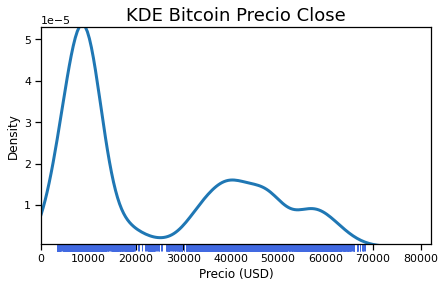

In [29]:
# Distribución KDE del precio de cierre de todos los activos
# ==============================================================================
fig, ax = plt.subplots(figsize=(7, 4))
p = sns.kdeplot(data=df_all[df_all['Coin'] == 'BTCUSDT'], x='close', linewidth=3, ax=ax)
r = sns.rugplot(data=df_all[df_all['Coin'] == 'BTCUSDT'], x='close', ax=ax, c='royalblue',
                height=-.03, clip_on=False)
p.set(xlim=(0, None))
p.set_title('KDE Bitcoin Precio Close', fontsize=18)
p.set_xlabel('Precio (USD)');

In [31]:
# Se localizan los datos correspondientes para cada año
# ==============================================================================
years = list(df_all.index.year.unique())
df_plot = pd.DataFrame()

for year in years:
    
    year_open  = df_all.loc[df_all.index.year == year, 'open'][0]
    year_close = df_all.loc[df_all.index.year == year, 'close'][-1]
    year_low   = df_all.loc[df_all.index.year == year, 'low'].min()
    year_high  = df_all.loc[df_all.index.year == year, 'high'].max()
    
    df_plot[year] = pd.Series([year_open, year_close, year_low, year_high]) 
    
df_plot = df_plot.T
df_plot = df_plot.set_axis(['open', 'close', 'low', 'high'], axis=1)

# Se calcula el % de cambio entre el open y el close del año
# ==============================================================================
df_plot['year_change'] = 100*(df_plot['close'] - df_plot['open']) / df_plot['open']
df_plot.head(3)

,open,close,low,high,year_change
2019,3690.0000,4.5618,0.3504,13970.0,-99.876374
2020,1.8007,744.0600,0.0001,29470.0,41220.597545
2021,11.5756,19.8900,2.3859,69000.0,71.826946


In [47]:
df_plot

,open,close,low,high,year_change
2019,3690.0000,4.5618,0.3504,13970.00,-99.876374
2020,1.8007,744.0600,0.0001,29470.00,41220.597545
2021,11.5756,19.8900,2.3859,69000.00,71.826946
2022,46811.7700,NaN,1.8600,48189.84,NaN


In [49]:
df_plot.index

Int64Index([2019, 2020, 2021, 2022], dtype='int64')

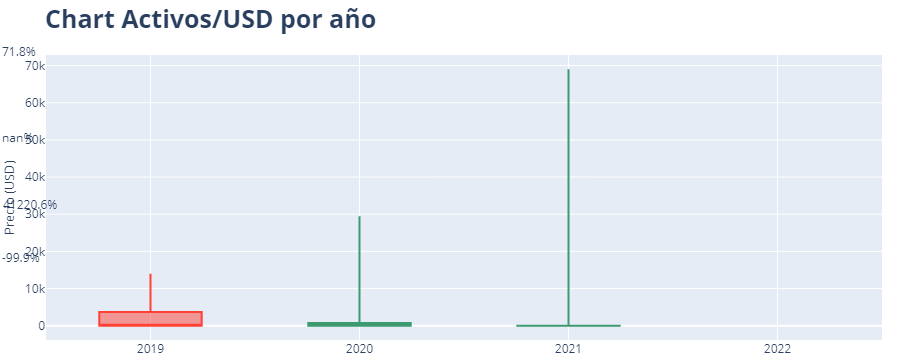

In [50]:
# Se crea una lista de dicts con las anotaciones de % de cambio para el gráfico
# ==============================================================================
annotations_list = []
max_high = df_plot['high'].max()

for year in years:
    
    df_aux = df_plot.loc[df_plot.index == year,]
    loc_x = pd.to_datetime(df_aux.index[0], format='%Y')
    loc_y = df_aux['high'].values[0]/max_high + 0.05
    text = '{:.1f}%'.format(df_aux['year_change'].values[0])
    
    annotation = dict(x=loc_x, y=loc_y, 
                      xref='x', yref='paper',
                      showarrow=False, xanchor='center', 
                      text=text)

    annotations_list.append(annotation)

# Gráfico de velas japonesas anual interactivo con Plotly
# ==============================================================================
candlestick = go.Candlestick(
                    x     = df_plot.index,
                    open  = df_plot.open,
                    close = df_plot.close,
                    low   = df_plot.low,
                    high  = df_plot.high
                    )

fig = go.Figure(data=[candlestick])

fig.update_layout(
    width       = 800,
    height      = 350,
    title       = dict(text='<b>Chart Profile/USD por año</b>', font=dict(size=25)),
    yaxis_title = dict(text='Precio (USD)', font=dict(size=13)),
    margin      = dict(l=0, r=20, t=55, b=20),
    xaxis_rangeslider_visible = False,
    annotations = annotations_list
    )

fig.show()

In [52]:
# Se localizan los datos correspondientes para cada mes
# ==============================================================================
years = list(df_all.index.year.unique())
df_plot = pd.DataFrame()

for year in years:
    for mes in range(12):
        
        start_date = pd.to_datetime(f'{year}-{mes+1}-01', format='%Y-%m-%d')
        end_date = (start_date + pd.offsets.MonthBegin())
        mask = (df_all.index >= start_date) & (df_all.index < end_date)
        
        if not df_all.loc[mask, :].empty:
                        
            month_open  = df_all.loc[mask, 'open'][0]
            month_close = df_all.loc[mask, 'close'][-1]
            month_low   = df_all.loc[mask, 'low'].min()
            month_high  = df_all.loc[mask, 'high'].max()
            
            serie  = pd.Series([month_open, month_close, month_low, month_high])
            df_aux = pd.DataFrame(serie, columns=[f'{str(mes+1).zfill(2)}-{year}'])
            
            if df_plot.empty:
                df_plot = df_aux.copy()
            else:
                df_plot = pd.concat([df_plot, df_aux], axis=1)

df_plot = df_plot.T
df_plot = df_plot.set_axis(['open', 'close', 'low', 'high'], axis=1)

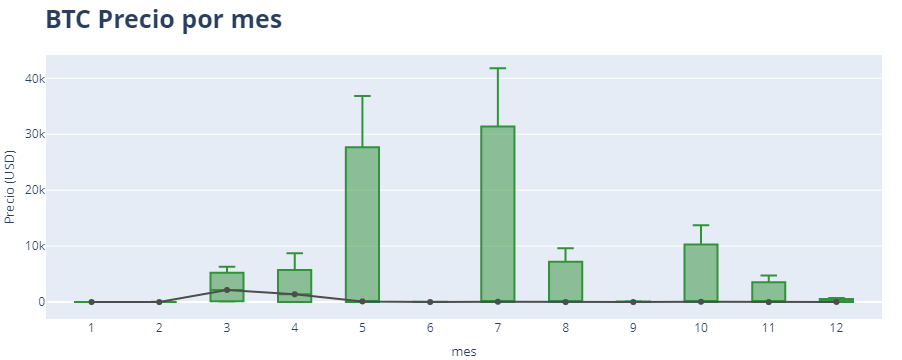

In [55]:
# Gráfico boxplot para estacionalidad anual
# ==============================================================================
import plotly.express as px

palette = {'naranja': '#f7931a',
               'blanco' : '#ffffff',
               'gris'   : '#4d4d4d',
               'azul'   : '#0d579b',
               'verde'  : '#329239'
            }

df_plot['mes'] = pd.to_datetime(df_plot.index, format='%m-%Y').month

# fig 1 boxplot de los meses
fig1 = px.box(df_plot.sort_values('mes'), x='mes', y='close',
              color_discrete_sequence=[palette['verde']])

# fig 2 line con datos de la mediana de cada mes
df_median = pd.DataFrame(df_plot.groupby('mes')['close'].median()).reset_index()
fig2 = px.line(df_median, x='mes', y='close', markers=True,
               color_discrete_sequence=[palette['gris']])

fig = go.Figure(data=fig1.data + fig2.data)

fig.update_layout(
    width       = 650,
    height      = 350,
    title       = dict(text='<b>BTC Precio por mes</b>', font=dict(size=25)),
    yaxis_title = dict(text='Precio (USD)', font=dict(size=13)),
    xaxis       = dict(tickmode='linear'),
    xaxis_title = dict(text='mes', font=dict(size=13)),
    margin      = dict(l=0, r=20, t=55, b=20)
    )

fig.show()

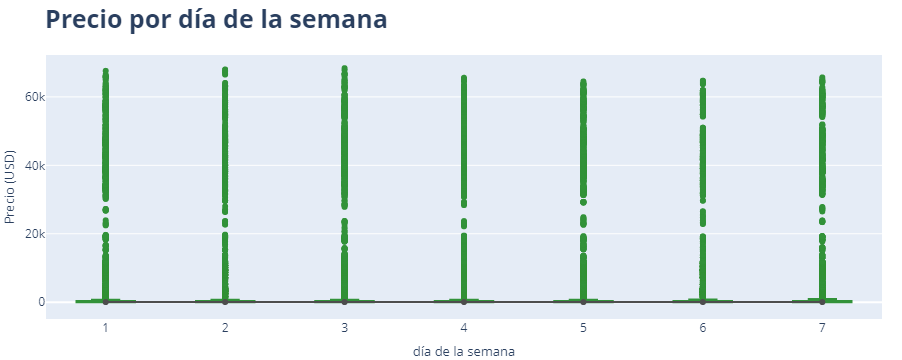

In [58]:
# Gráfico boxplot para estacionalidad semanal
# ==============================================================================

df_all['dia_semana'] = df_all.index.day_of_week + 1

# fig 1 boxplot de los días de la semana
fig1 = px.box(df_all.sort_values('dia_semana'), x='dia_semana', y='close',
              color_discrete_sequence=[palette['verde']])

# fig 2 line con datos de la mediana los días de la semana
df_median = pd.DataFrame(df_all.groupby('dia_semana')['close'].median()).reset_index()
fig2 = px.line(df_median, x='dia_semana', y='close', markers=True,
               color_discrete_sequence=[palette['gris']])

fig = go.Figure(data=fig1.data + fig2.data)

fig.update_layout(
    width       = 650,
    height      = 350,
    title       = dict(text='<b>Precio por día de la semana</b>', font=dict(size=25)),
    yaxis_title = dict(text='Precio (USD)', font=dict(size=13)),
    xaxis       = dict(tickmode='linear'),
    xaxis_title = dict(text='día de la semana', font=dict(size=13)),
    margin      = dict(l=0, r=20, t=55, b=20)
    )

fig.show()

**Candlestick charts**

Este tipo de gráficos se utiliza como una herramienta para visualizar y analizar el movimiento de los precios a lo largo del tiempo. Nos muestra la información de los precios de OHLC (open, high, low, close) en cada una de las sesiones (una sesión es un periodo de tiempo definido, en nuestro caso 1 hora.)

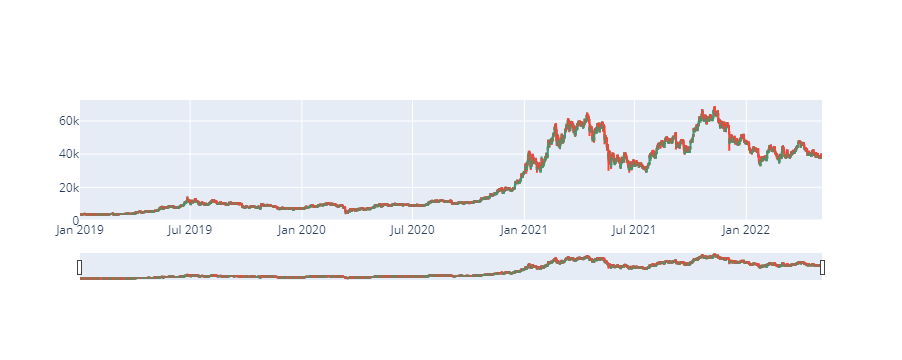

In [14]:
trace = go.Candlestick(x=df_BTC_colum.index,
                open=df_BTC_colum.open,
                high=df_BTC_colum.high,
                low=df_BTC_colum.low,
                close=df_BTC_colum.close)
data = [trace]
iplot(data, filename='simple_candlestick')

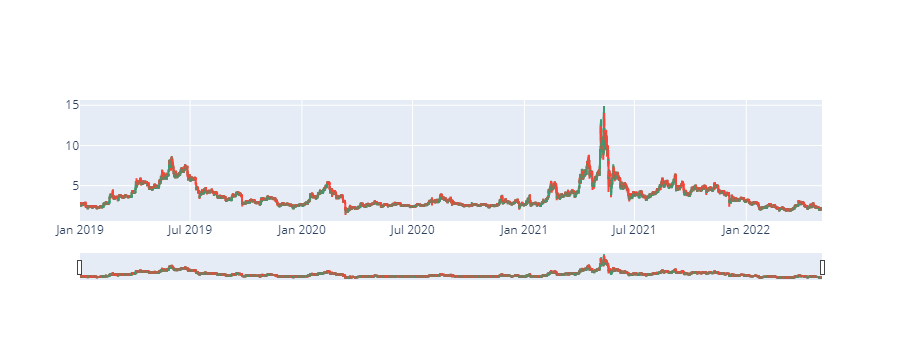

In [15]:
trace = go.Candlestick(x=df_EOS_colum.index,
                open=df_EOS_colum.open,
                high=df_EOS_colum.high,
                low=df_EOS_colum.low,
                close=df_EOS_colum.close)
data = [trace]
iplot(data, filename='simple_candlestick')

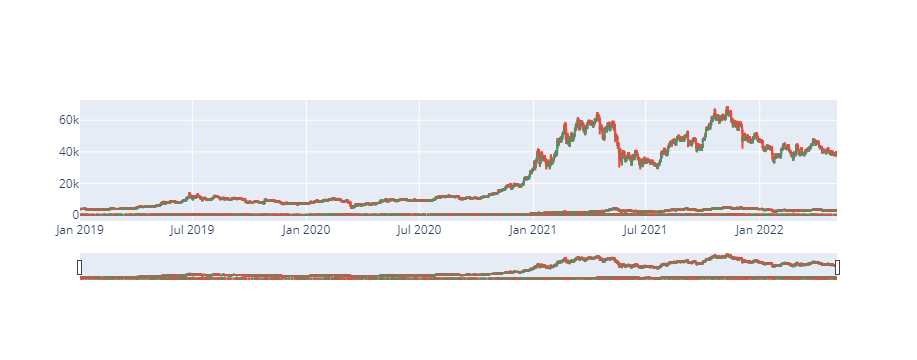

In [16]:
trace = go.Candlestick(x=df_all.index,
                open=df_all.open,
                high=df_all.high,
                low=df_all.low,
                close=df_all.close)
data = [trace]
iplot(data, filename='simple_candlestick')

In [17]:
df_all['Hour'].describe()

count    43750.000000
mean        10.014354
std          6.827865
min          0.000000
25%          4.000000
50%         12.000000
75%         16.000000
max         20.000000
Name: Hour, dtype: float64

In [18]:
print(df_all['Hour'].min())

print(np.percentile(df_all['Hour'], 20))

print(np.percentile(df_all['Hour'], 40))

print(np.percentile(df_all['Hour'], 80))

print(df_all['Hour'].max())


0
4.0
8.0
16.0
20


In [19]:
print(df_all['Hour'].max() - np.percentile(df_all['Hour'], 80) )
print(np.percentile(df_all['Hour'], 40) - np.percentile(df_all['Hour'], 20))
print(np.percentile(df_all['Hour'], 20) - np.percentile(df_all['Hour'], 00))

4.0
4.0
4.0


<AxesSubplot:xlabel='date'>

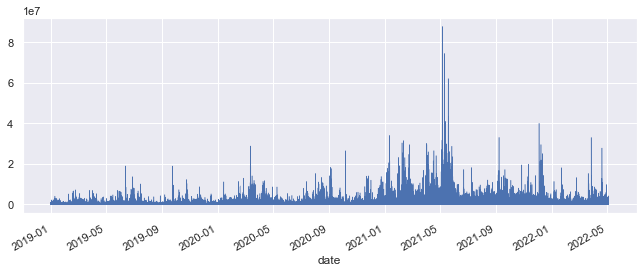

In [20]:
sns.set(rc={'figure.figsize':(11, 4)})
df_all['volume'].plot(linewidth=0.5)

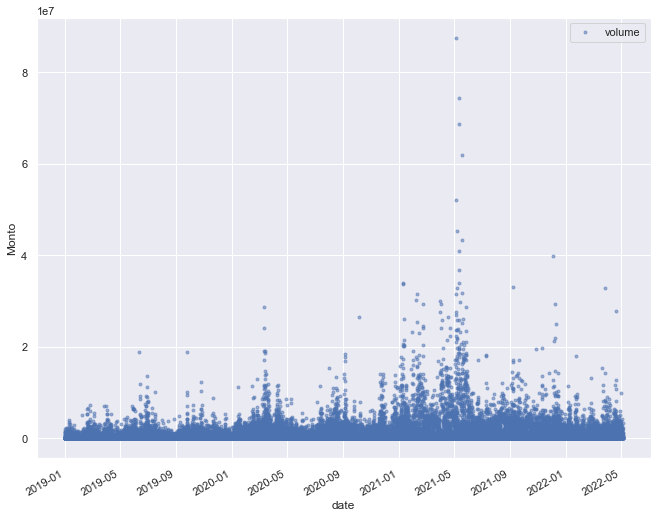

In [21]:
cols_plot = ['volume']
axes = df_all[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Monto')

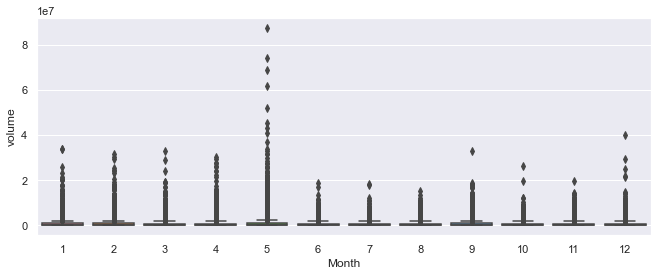

In [22]:
sns.boxplot(data=df_all,x='Month', y='volume');

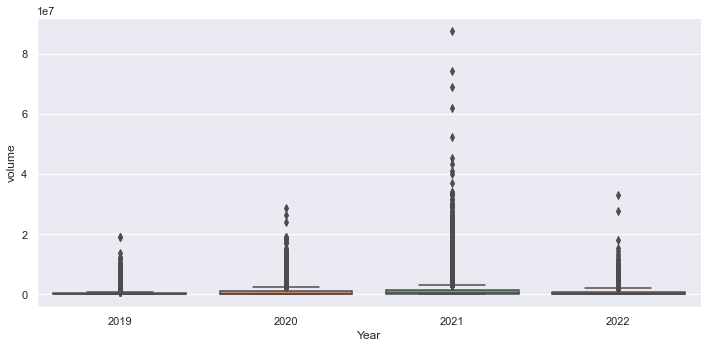

In [23]:
fig = plt.figure(figsize=(10,5))
sns.boxplot(data = df_all, x='Year', y = 'volume')
fig.tight_layout()
plt.show()

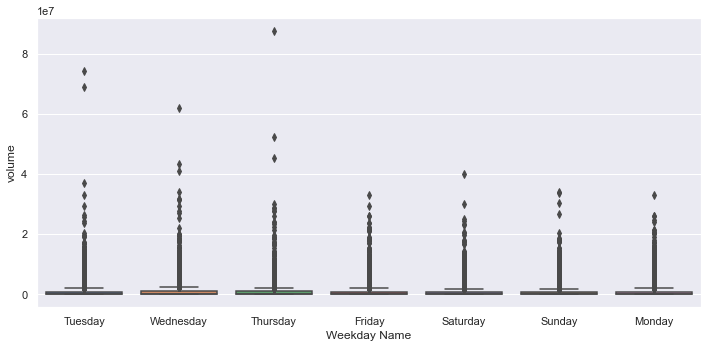

In [24]:
fig = plt.figure(figsize=(10,5))
sns.boxplot(data = df_all, x='Weekday Name', y = 'volume')
fig.tight_layout()
plt.show()

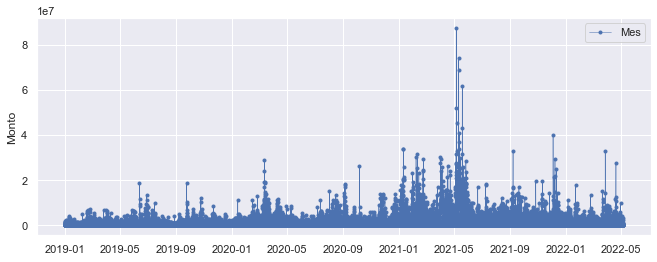

In [25]:
start, end = '2019-01', '2022-06'

fig, ax = plt.subplots()
ax.plot(df_all.loc[start:end, 'volume'],
marker='.', linestyle='-', linewidth=0.5, label='Mes')
ax.set_ylabel('Monto')
ax.legend();

# Revisar

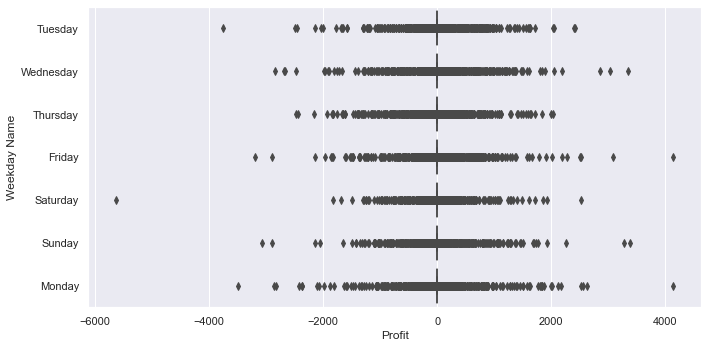

In [26]:
fig = plt.figure(figsize=(10,5))
sns.boxplot(data = df_all, x='Profit', y = 'Weekday Name')
fig.tight_layout()
plt.show()

In [27]:
pd.options.display.float_format = '{:,.1f}'.format
df_all_mean = df_all.groupby(by = 'Month').mean()
df_all_mean

,open,high,low,close,volume,Year,Day,Hour,Profit
Month,,,,,,,,,
1,"3,939.6","3,996.3","3,876.7","3,939.1","855,629.1","2,020.5",16.2,10.0,-0.5
2,"4,371.3","4,433.3","4,314.0","4,378.5","907,787.2","2,020.5",14.6,10.0,4.3
3,"4,712.5","4,771.9","4,662.5","4,720.1","822,904.0","2,020.5",16.0,10.0,2.9
4,"4,882.6","4,920.8","4,824.0","4,875.3","953,926.2","2,020.5",15.5,10.0,-0.1
5,"3,914.5","3,968.1","3,834.4","3,904.6","1,386,897.8","2,020.1",15.4,10.0,-4.8
6,"3,217.5","3,265.5","3,173.5","3,221.3","670,664.9","2,020.0",15.5,10.0,-0.3
7,"3,191.2","3,227.5","3,157.0","3,193.9","648,223.8","2,020.0",16.0,10.0,2.7
8,"3,996.5","4,031.3","3,952.7","3,994.8","764,210.6","2,020.0",16.0,10.0,1.2
9,"3,924.9","3,961.5","3,880.4","3,923.1","832,239.5","2,020.0",15.5,10.0,-1.8


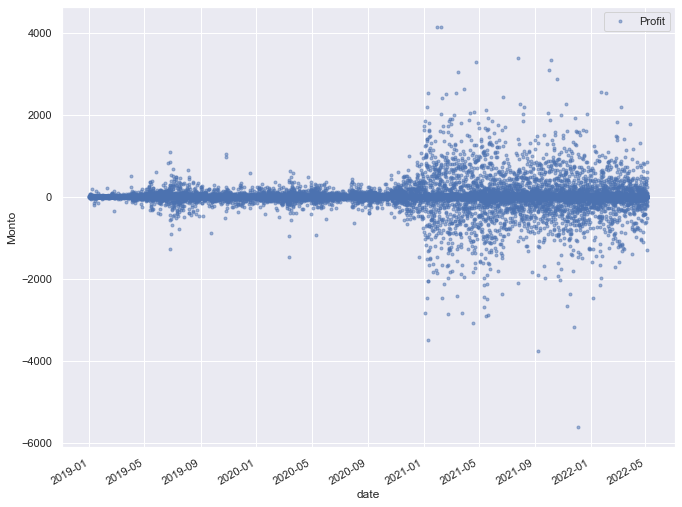

In [28]:
cols_plot = ['Profit']
axes = df_all[cols_plot].plot(marker='.', alpha=0.5, linestyle='None', figsize=(11, 9), subplots=True)
for ax in axes:
    ax.set_ylabel('Monto')

In [29]:
df_all

,open,high,low,close,volume,Coin,Year,Month,Day,Time,Hour,Weekday Name,Profit
date,,,,,,,,,,,,,
2019-01-01 00:00:00,"3,690.0","3,720.0","3,685.8","3,703.6","3,346.8",BTCUSDT,2019,1,1,00:00:00,0,Tuesday,13.6
2019-01-01 04:00:00,"3,703.6","3,732.0","3,696.1","3,713.1","3,200.7",BTCUSDT,2019,1,1,04:00:00,4,Tuesday,9.4
2019-01-01 08:00:00,"3,713.1","3,756.9","3,684.2","3,698.5","3,324.1",BTCUSDT,2019,1,1,08:00:00,8,Tuesday,-14.5
2019-01-01 12:00:00,"3,698.3","3,701.7","3,642.0","3,659.4","3,089.3",BTCUSDT,2019,1,1,12:00:00,12,Tuesday,-38.9
2019-01-01 16:00:00,"3,659.6","3,730.0","3,659.6","3,711.2","4,906.8",BTCUSDT,2019,1,1,16:00:00,16,Tuesday,51.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-05-04 20:00:00,105.5,106.9,105.5,106.4,"38,212.6",LTCUSDT,2022,5,4,20:00:00,20,Wednesday,0.9
2022-05-05 00:00:00,106.3,106.4,105.1,105.3,"41,031.6",LTCUSDT,2022,5,5,00:00:00,0,Thursday,-1.0
2022-05-05 04:00:00,105.3,105.6,104.5,105.2,"51,883.5",LTCUSDT,2022,5,5,04:00:00,4,Thursday,-0.1


#### Variables

- __Fecha__: se la usa como índice del _pandasDataFrame_.

#### Activos

Todos los activos están expresados en una misma moneda, *quote*, que en nuestro caso es USDT (un token de USD)


#### ¿Cuándo opera el mercado?

Este es un mercado que trabaja 24/7, es decir, está operando constantemente. En cada caso tenemos datos por hora (por lo tanto, una sesión equivale a una hora) de los diferentes precios **OHLC** de cada activo y el volumen, a saber:

- **OPEN :** precio al cual abre el activo, en la sesión.
- **HIGH :** mayor precio alcanzado por el activo en la sesión.
- **LOW :** menor precio alcanzado por el activo en la sesión.
- **CLOSE :** precio del activo al momento de cerrar la sesión. 
- **VOLUMEN :** cantidad del activo operado en la sesión.

Para conocer más sobre estos proyectos, pueden visitar la página [CoinMarketCap](https://coinmarketcap.com/). Allí encontrarán datos interesantes sobre cada par, su posición en el mercado, nacimiento de cada proyecto, entre otros.

# 📖 ¡Actividades! 

El objetivo general del práctico es realizar un análsis exploratorio del comportamiento de los __activos__ propuestos.
Se plantean algunas sugerencias para explorar las series en forma individual y conjunta por medio de medidas descriptivas y visualizaciones.

Como las observaciones se encuentran indexadas en el tiempo, este tipo de datos se conocen como __series de tiempo__, por lo que algunas de las herramientas estadísticas habituales deben interpretarse con cierto cuidado y se pueden usar algunos recursos analíticos adicionales. 

A continuación comparto algunos links que puede ser de ayuda para el abordaje de nuestro problema.

- [Tutorial: Time Series analysis with pandas](https://www.dataquest.io/blog/tutorial-time-series-analysis-with-pandas/)
- [Kaggle : Everything you can do with a time series](https://www.kaggle.com/thebrownviking20/everything-you-can-do-with-a-time-series)
- [Kaggle: Time series analysis in Python](https://www.kaggle.com/kashnitsky/topic-9-part-1-time-series-analysis-in-python)

***Sugerencia*** Si creemos que repetiremos un bloque de código varias veces, entonces será bueno modularizar esos bloques dentro de funciones.

## Parte I

Se proponen las siguientes actividades:


- Determinen el tipo de variables y el período de tiempo bajo análisis. ¿El periodo es el mismo para todos los activos?


- Indaguen sobre la existencia de valores faltantes. Para discutir, ¿cómo tratarían a los faltantes? ¿por qué? 


- Analicen las distribuciones por medio de gráficos y medidas de estadística descriptiva (por ejemplo: media, varianza y coeficiente de variación). Pueden pensar en una ventana de tiempo móvil para calcular dichas medidas (indaguen el método `.rolling()`). **(AA)**


- ¿Hay outliers?  **(AA)**


- Seleccionen algunos activos y grafiquen un boxplot con los datos de cada mes (y/o semana). ¿La distribución se mantiene constante en el tiempo?  **(AA)**


- Exploren la existencia de estacionalidad.  **(AA)**


- Estudien la evolución temporal de los activos. ¿En qué sentido tienden a moverse? ¿Detectan períodos de crisis? ¿Los activos tienden a moverse en forma conjunta?  En caso de que existan crisis, ¿son globales o individuales? Para poder realizar una mejor comparación, deberán normalizar los datos. 

## Parte II

Que el precio de un activo sea mayor al de otro no significa que el primero sea una mejor inversión, entonces, el análisis de este tipo de series se centra por lo general en el cambio porcentual de los precios en vez del cambio en los valores absolutos. Esto resulta en que en vez de modelar los precios de los activos, previamente se habitúa realizar una transformación logarítmica o trabajar con la tasa de rendimiento. 


- Calculen los logaritmos naturales de los precios de los activos y la serie de tasas de rendimiento (para ello explorar el método `.pct_change()`). Muestren graficamente algunos de ellos.


- Realicen nuevamente un análisis de las distribuciones por medio de gráficos y medidas de estadística descriptiva con las nuevas series. **(AA)**


- Exploren la volatilidad de las series, por ejemplo graficando las desviaciones estándar móviles. **(AA)**


**(AA)**: Algunos activos.

## Opcional


**¿Los días de la semana influyen en el precio de los activos?**

Según un [estudio realizado](https://www.sciencedirect.com/science/article/pii/S1544612318304240), los valores de Bitcoin son significativamente más altos los días lunes. ¿Qué pueden decir al respecto? 

Agrupen los datos de acuerdo a los días de la semana y exploren la estacionalidad diaria. Comparen los gráficos de Bitcoin con el de otro activos. 

# Fecha de entrega

- __Versión preliminar: 20/5__ 

# Condiciones de entrega

Realizar un informe en el cual se presenten los resultados y conclusiones del análisis desarrollado. El mismo debe estar pensado para un público técnico pero que desconoce los aspectos propios del problema a resolver. Dicho informe puede ser un notebook, a condición de que en el mismo se efectúe un análisis escrito suficientemente detallado de los resultados. 